# Capstone Project: Exploratory Data Analysis

### Imports

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib.image as mpimg
from IPython.display import set_matplotlib_formats
set_matplotlib_formats('svg') # Thanks Riley!

<ipython-input-1-0cdaf5f41691>:7: DeprecationWarning: `set_matplotlib_formats` is deprecated since IPython 7.23, directly use `matplotlib_inline.backend_inline.set_matplotlib_formats()`
  set_matplotlib_formats('svg') # Thanks Riley!


### Dataset

In [2]:
capstone_df = pd.read_csv("../data/location_with_google_ratings.csv")

In [3]:
capstone_df.head()

,area,county,city_or_town,lat_area,long_area,population,median_household_income,income_per_capita,name,address,lat_venue,long_venue,categories,price_level,rating,user_ratings_total
0,Alameda,Alameda,City,37.734379,-122.23952,77624,104756,52448,Chuck Corica Golf Complex,1 Clubhouse Memorial Rd,37.738885,-122.234326,Golf Course,0.0,0.0,0.0
1,Alameda,Alameda,City,37.734379,-122.23952,77624,104756,52448,Shoreline Park,"Alameda, CA",37.742580,-122.250126,Park,0.0,0.0,0.0
2,Alameda,Alameda,City,37.734379,-122.23952,77624,104756,52448,Angel Fish Japanese Cuisine,883 C-2 Island Dr,37.737478,-122.240107,Japanese Restaurant,2.0,4.3,112.0
3,Alameda,Alameda,City,37.734379,-122.23952,77624,104756,52448,La Penca Azul,891 Island Dr Ste B (at Mecartney Rd),37.737667,-122.240767,Mexican Restaurant,2.0,4.3,2263.0
4,Alameda,Alameda,City,37.734379,-122.23952,77624,104756,52448,La Val's Pizza,891 Island Dr,37.737610,-122.241001,Italian Restaurant,2.0,4.4,190.0


To understand the information gathered, we can explore the data through visualizations as seen below.

### Mapping

In [4]:
area_df = capstone_df.groupby(["county","area","population"])[["lat_area","long_area"]].mean()

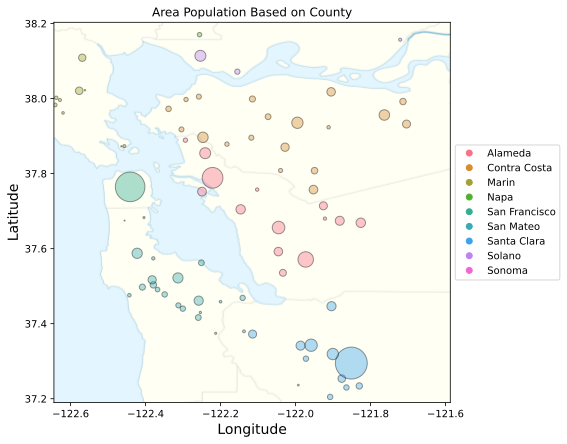

In [5]:
# Sources:
# - https://en.wikipedia.org/wiki/Module:Location_map/data/United_States_San_Francisco_Bay_Area
# - https://www.bigendiandata.com/2017-06-27-Mapping_in_Jupyter/
# - https://kanoki.org/2020/08/30/matplotlib-scatter-plot-color-by-category-in-python/
# - https://stackoverflow.com/questions/42180475/how-to-add-legend-to-scatter-plot-that-has-colour-assignment

california_img=mpimg.imread('../graphics/bay_area_map.png')
color_labels = area_df.index.get_level_values(level = "county").unique()
rgb_values = sns.color_palette("husl", len(color_labels))
color_map = dict(zip(color_labels, rgb_values))

ax = area_df.plot(kind="scatter", 
                      x="long_area", 
                      y="lat_area", 
                      figsize=(10,7),
                      c=area_df.index.get_level_values(level = "county").map(color_map),
                      edgecolors = "black",
                      s=area_df.index.get_level_values(level = "population")/1000,
                      colorbar=False, 
                      alpha=0.4,
                      )

leg = [plt.plot([], marker="o", ls="", color=color)[0] for color in rgb_values] # Thanks Helen!
plt.legend(leg,color_labels,loc='center left', bbox_to_anchor=(1, 0.5))

plt.imshow(california_img, extent=[-122.6445, -121.5871, 37.1897, 38.2033], alpha=0.5)
plt.title("Area Population Based on County")
plt.ylabel("Latitude", fontsize=14)
plt.xlabel("Longitude", fontsize=14)

plt.show()

Out of ~14.9K venues collected from 101 cities / towns in 9 counties around the Bay Area, the map above shows a summary of the particular areas weighted based on the number of population in said cities / towns and categorized by counties. We can observe that out of all the counties, San Francisco, Santa Clara and Alameda are three of the highest populated counties.

In [6]:
coffee_df = capstone_df[["name","categories","long_venue","lat_venue","user_ratings_total"]]
coffee_df["cat"] = coffee_df["categories"].map(lambda x: x if x == "Coffee Shop" else "Other Venues")

<ipython-input-6-33e22176390a>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  coffee_df["cat"] = coffee_df["categories"].map(lambda x: x if x == "Coffee Shop" else "Other Venues")


In [7]:
color_labels = coffee_df["cat"].unique()
rgb_values = ["salmon","navy"]
color_map = dict(zip(color_labels, rgb_values))


fig = plt.figure(figsize=(10,7))
ax = fig.add_subplot()

ax.scatter(coffee_df[coffee_df["cat"] != "Coffee Shop"]["long_venue"], 
        coffee_df[coffee_df["cat"] != "Coffee Shop"]["lat_venue"], 
        c=color_map["Other Venues"],
        s=coffee_df[coffee_df["cat"] != "Coffee Shop"]["user_ratings_total"]/100,
        alpha = 0.5,
        label = "Other Venues")

ax.scatter(coffee_df[coffee_df["cat"] == "Coffee Shop"]["long_venue"], 
        coffee_df[coffee_df["cat"] == "Coffee Shop"]["lat_venue"], 
        c=color_map["Coffee Shop"],
        s=coffee_df[coffee_df["cat"] == "Coffee Shop"]["user_ratings_total"]/100,
        alpha = 1,
        label = "Coffee Shop")

plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))

plt.imshow(california_img, extent=[-122.6445, -121.5871, 37.1897, 38.2033], alpha=0.5)
plt.title("Venues Based on User Ratings")
plt.ylabel("Latitude", fontsize=14)
plt.xlabel("Longitude", fontsize=14)

plt.show()

Looking at the map above, we can see the venues collected weighted by user ratings based on its location within the Bay Area. We can observe how coffee shops seem to cluster in relatively high populated areas like San Francisco and Alameda, when comparing the above map to one showing Area Population Based on County. 

### Income Distribution

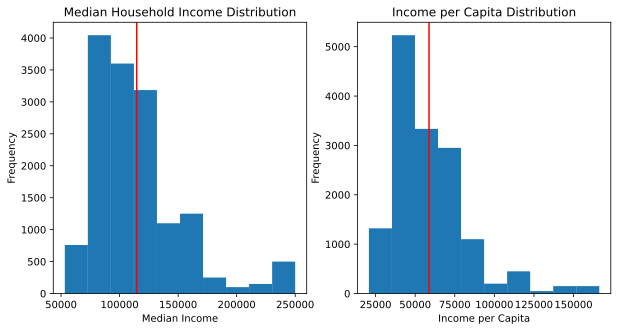

In [8]:
fig, ax = plt.subplots(1,2,figsize=(10,5))


ax[0].hist(capstone_df["median_household_income"])
ax[0].axvline(capstone_df["median_household_income"].mean(),color="r")
ax[0].set_title("Median Household Income Distribution")
ax[0].set_xlabel("Median Income")
ax[0].set_ylabel("Frequency")

ax[1].hist(capstone_df["income_per_capita"])
ax[1].axvline(capstone_df["income_per_capita"].mean(),color="r")
ax[1].set_title("Income per Capita Distribution")
ax[1].set_xlabel("Income per Capita")
ax[1].set_ylabel("Frequency");

Both income data distribution are positively skewed, in which the mode and median are less than the mean as seen on the graphs above and table below:

***Summary Statistics (USD)***

| **Income Data** | **Mean** | **Median** | **Mode** | **Min** | **Max** |
|---|---|---|---|---|---|
| Median Income | 114.6K | 109.6K | 109.6K | 53.2K | 250.0K |
| Income per Capita | 58.7K | 53.1K | 46.6K | 20.1K | 166.3K |

Lower income areas include Portola Valley, Belvedere, and Monte Sereno, with a median income of USD 250.0K and income per capita of USD 140.0K, USD 166.3K, and 129.0K, respectively. Whilst higher income areas include Calistoga, East Palo Alto, and San Pablo, with a median income of USD 67.1K, USD 67.1K, and USD 53.2K and income per capita of USD 48.2K, USD 27.7K, and USD 20.8K, respectively.

### Categorical Analysis

In [9]:
df_categorical = pd.DataFrame(capstone_df["categories"].value_counts().head(20))

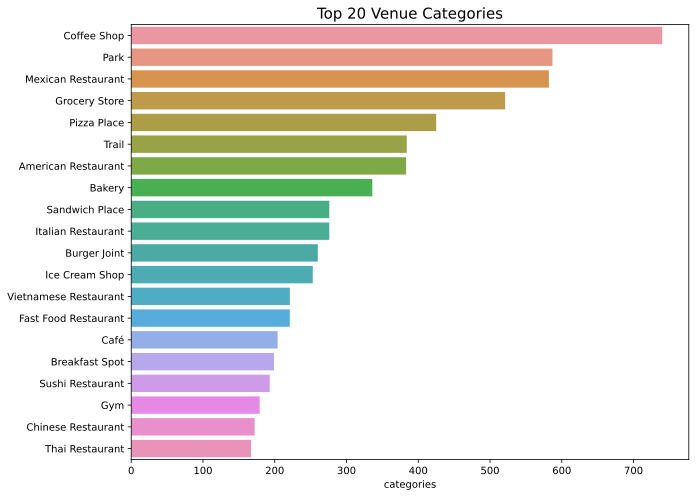

In [10]:
plt.figure(figsize=(10,8))

sns.barplot(x=df_categorical["categories"],y=df_categorical.index)
plt.title("Top 20 Venue Categories", size=15);

The bar chart above shows the top 20 venues by category, the most collected being Coffee Shops, followed by Parks, Mexican Restaurants, Grocery Stores and Pizza Place. Out of the ~14.9K venues collected, 740 of them are Coffee Shops. 

### Price Level, Rating and User Rating Overall vs Coffee Shops

In [11]:
def boxplot(column_name,title):
    fig, ax = plt.subplots()
    columns = [capstone_df[column_name], capstone_df[capstone_df["categories"] == "Coffee Shop"][column_name]]
    ax.boxplot(columns, patch_artist=True, meanline=True, showmeans=True)
    plt.title(title)
    plt.xticks([1, 2], ["All Venues", "Coffee Shops"])
    plt.show()

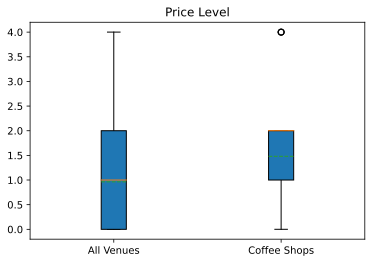

In [12]:
boxplot("price_level","Price Level")

When looking at the distribution of Price Level of all venues vs Coffee Shops, we can observe that average (dotted green line) and median (yellow line) Price Levels for Coffee Shops are slightly higher at 1.48 vs 0.96 and 2 vs 1, respectively.

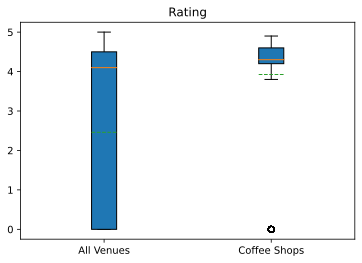

In [13]:
boxplot("rating","Rating")

When looking at the distribution of Ratings of all venues vs Coffee Shops, we can observe that average (dotted green line) and median (yellow line) ratings for Coffee Shops are slightly higher at 3.9 vs 2.5 and 4.3 vs 4.1 out of 5, respectively.

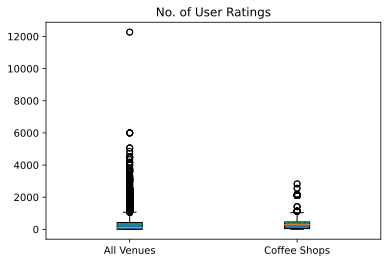

In [14]:
boxplot("user_ratings_total","No. of User Ratings")

When looking at the distribution of No. of User Ratings of all venues vs Coffee Shops, we can observe that average (dotted green line) and median (yellow line) No. of User Ratings for Coffee Shops are slightly higher at 434 vs 327 and 288 vs 108, respectively.

### Coffee Shop Analysis

Out of 101 areas, 96 of them have recommended Coffee Shops according to Foursquare API; the ones that do not are Portola Valley, Rio Vista, St. Helena, San Bruno and Yountville.

In [15]:
def bar(x,y,title,xlabel,w,h):
    plt.figure(figsize=(w,h)) 
    sns.barplot(x=x,y=y)
    plt.title(title, size=15),
    plt.xlabel(xlabel);

#### Number of Recommended Coffee Shop per Area

In [16]:
coffee_shop_area = pd.DataFrame(capstone_df[capstone_df["categories"] == "Coffee Shop"].groupby("area")["name"].count())

In [17]:
coffee_shop_area.sort_values("name", ascending = False, inplace = True)

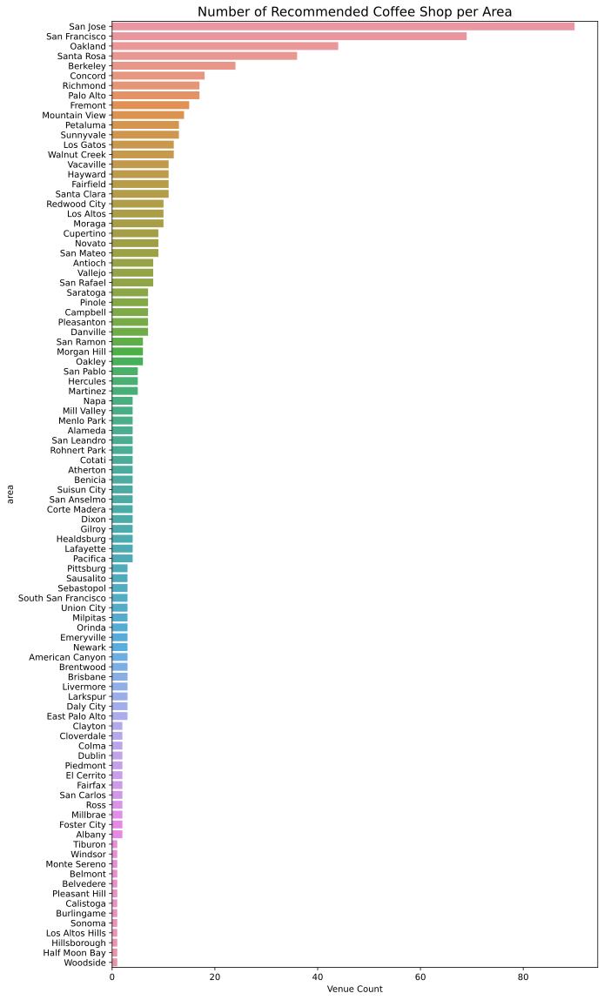

In [18]:
bar(coffee_shop_area["name"],
    coffee_shop_area.index,
    "Number of Recommended Coffee Shop per Area",
    "Venue Count",
    10,
    20)
   

San Jose, San Francisco, Santa Rosa and Berkely are 5 cities with the largest number of Coffee Shops, with 90, 69, 44, 36 and 34 outlets respectively. 80% of outlets can be found in 40% of the cities collected. 

#### Coffee Shop by Brand

In [19]:
coffee_shop_by_brand = pd.DataFrame(capstone_df[capstone_df["categories"] == "Coffee Shop"]["name"].value_counts())

In [20]:
coffee_shop_by_brand["cat"] = coffee_shop_by_brand["name"].map(lambda x: coffee_shop_by_brand[coffee_shop_by_brand["name"] == x].index[0] if x > 5 else "Coffee Shop with < 5 Branches")

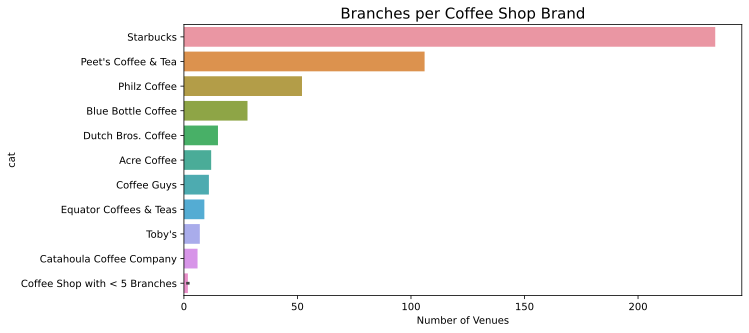

In [21]:
bar(coffee_shop_by_brand["name"],
    coffee_shop_by_brand["cat"],
    "Branches per Coffee Shop Brand",
    "Number of Venues",
    10,
    5)

The above chart shows the number of branches by coffee shop brands collected regardless of area. Out of the 740 coffee shops collected, there are 10 brands with more than 5 outlets in the Bay Area, which are:

- Starbucks: 234 outlets
- Peet's Coffee & Tea: 106 outlets
- Philz Coffee: 52 outlets
- Blue Bottle Coffee: 28 outlets
- Dutch Bros. Coffee: 15 outlets
- Acre Coffee: 12 outlets
- Coffee Guys: 11 outlets
- Equator Coffees & Teas: 9 outlets
- Toby's: 7 outlets
- Catahoula Coffee Company: 6 outlets

#### Coffee Shop per Population

In [22]:
pop_per_rec_coffee_shop = pd.DataFrame(capstone_df[capstone_df["categories"] == "Coffee Shop"].groupby("area")["population"].unique()/capstone_df[capstone_df["categories"] == "Coffee Shop"].groupby("area")["name"].count())

In [23]:
pop_per_rec_coffee_shop["pop_per_shop"] = pop_per_rec_coffee_shop.iloc[:, 0].map(lambda x: x[0])

In [24]:
pop_per_rec_coffee_shop.sort_values("pop_per_shop", ascending = False, inplace = True)

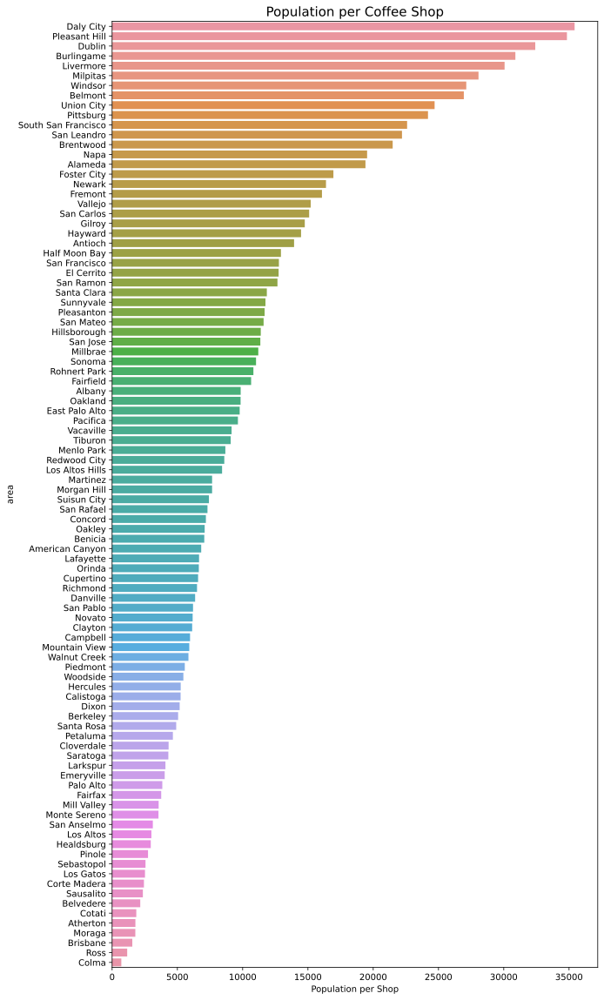

In [25]:
bar(pop_per_rec_coffee_shop["pop_per_shop"],
    pop_per_rec_coffee_shop.index,
    "Population per Coffee Shop",
    "Population per Shop",
    10,
    20)

The bar chart represents the density of population per number of Coffee Shops in the area. The higher the number, the less number of coffee shops there are per person which may prove to be a useful point of inference when analysing the result of the model.  

#### Average Coffee Shop Rating per Area

In [26]:
avg_rate_per_area = pd.DataFrame(capstone_df[capstone_df["categories"] == "Coffee Shop"].groupby("area")["rating"].mean())

In [33]:
avg_rate_per_area.sort_values("rating",ascending = False, inplace = True)

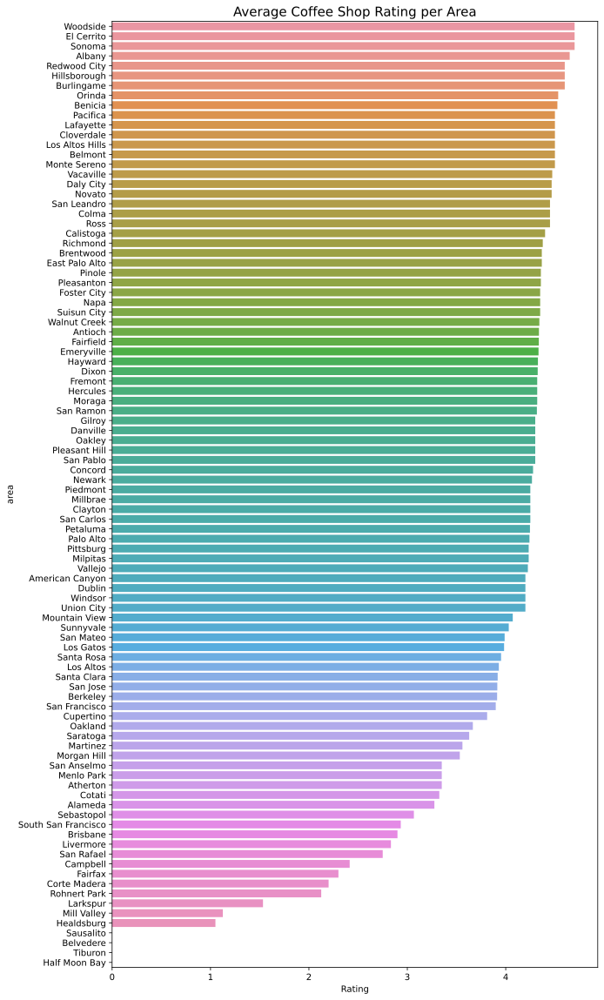

In [28]:
bar(avg_rate_per_area["rating"],
    avg_rate_per_area.index,
    "Average Coffee Shop Rating per Area",
    "Rating",
    10,
    20)

The bar chart represents the average rating of Coffee Shops per area. This may prove to be a useful point of inference when analysing the result of the model.

#### Average Coffee Shop Price Level

In [29]:
avg_pl_per_area = pd.DataFrame(capstone_df[capstone_df["categories"] == "Coffee Shop"].groupby("area")["price_level"].mean())

In [30]:
avg_pl_per_area.sort_values("price_level",ascending = False, inplace = True)

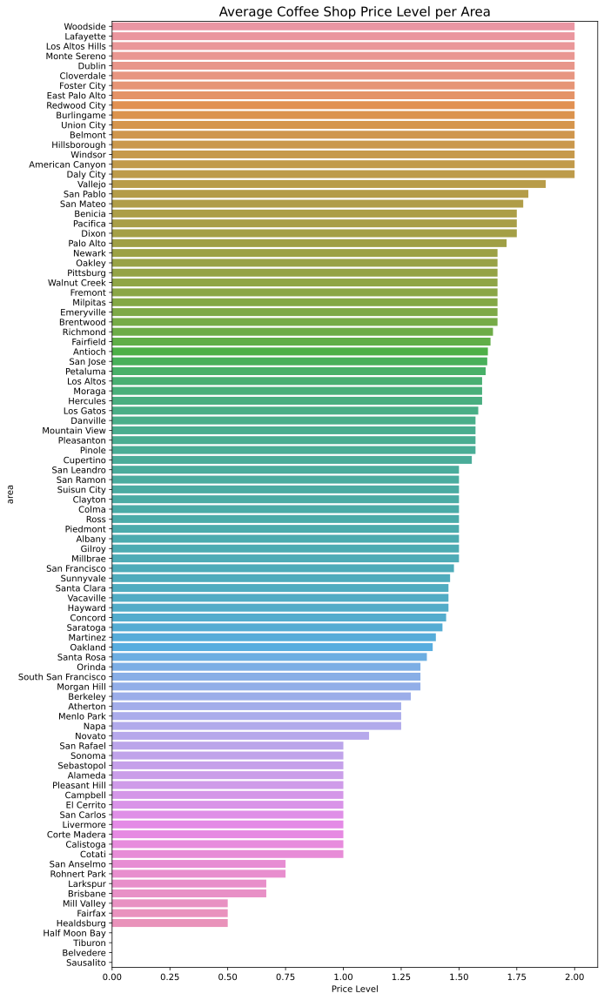

In [31]:
bar(avg_pl_per_area["price_level"],
    avg_pl_per_area.index,
    "Average Coffee Shop Price Level per Area",
    "Price Level",
    10,
    20)

The bar chart represents the average price level of coffee shops in the area. We can observe that the highest price level is 2, which means one order can be around USD 10-25 - a relatively steep price for coffee. We can also see that Half Moon Bay, Tiburon, Belverea and Susalito's price levels are 0, this is due to the fact that some venues do not have Google API's atmospheric data.